In [7]:
import pandas as pd
from sklearn.preprocessing import RobustScaler
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

In [8]:
def load_data(path):
    df = pd.read_excel(path,header=None)
    data_head = list(df[:][0])
    df = df.drop(columns=[0])
    df = df.T
    return data_head,df

In [9]:
def data_pretreat(df,window1,upersample,window2):
    df_new = df.ewm(span=window1).mean()
    df_new.index = range(0, upersample*len(df_new), upersample)
    df_new = df_new.reindex(index=range(upersample*len(df_new)))
    df_new = df_new.interpolate(kind='linear')
    df_new = df_new.ewm(span=window2).mean()
    return df_new

In [10]:
def get_road_near(road_edge_idx):
    near_list = []
    road_edge = data_head[road_edge_idx]
    near_list.append(road_edge_idx)
    from_col = road_edge[0]
    from_raw = road_edge[1]
    to_col = road_edge[2]
    to_raw = road_edge[3]
    if ord(from_col)-1 >= ord('A'):
        lastnode = ''+chr(ord(from_col)-1)+from_raw+from_col+from_raw
        near_list.append(data_head.index(lastnode))
    if eval(from_raw)+1 <= 4:
        lastnode = ''+from_col+str(eval(from_raw)+1)+from_col+from_raw
        near_list.append(data_head.index(lastnode))
    if ord(to_col)+1 <= ord('E'):
        nextnode = ''+to_col+to_raw+chr(ord(to_col)+1)+to_raw
        near_list.append(data_head.index(nextnode))
    if eval(to_raw)-1 >=0:
        nextnode = ''+to_col+to_raw+to_col+str(eval(to_raw)-1)
        near_list.append(data_head.index(nextnode))
    return near_list

In [55]:
def selectdata(df,entry_point,start_time,end_time,upersample):
    if entry_point != None:
        data_filter = get_road_near(entry_point)
        head_filtted = [data_head[i] for i in data_filter]
        sel_data = df[start_time*upersample:end_time*upersample+1][data_filter]
    else:
        data_filter = [i for i in range(40)]
        head_filtted = [data_head[i] for i in data_filter]
        sel_data = df[start_time*upersample:end_time*upersample+1][data_filter]
    return data_filter,head_filtted,sel_data

In [6]:
def drawdata(sel_data):
    sel_data.columns = [data_head[i] for i in list(sel_data.columns)]
    sel_data.plot(title='{} and neighbors from {} to {},upersample={}'.format(data_head[entry_point],start_time,end_time,upersample))

In [7]:
def get_traintest(sel_data,step):
    scaler = RobustScaler()
    train = scaler.fit_transform(sel_data[:-1])
    train = train.reshape(-1, step, train.shape[-1])
    targets = sel_data[1:][entry_point].to_numpy().reshape(-1,step)
    return train,targets

In [8]:
'''
road_nodes = []
for i in range(4,-1,-1):
    row=[]
    for j in ['A','B','C','D','E']:
        row.append(j+str(i))
    road_nodes.append(row)
'''

"\nroad_nodes = []\nfor i in range(4,-1,-1):\n    row=[]\n    for j in ['A','B','C','D','E']:\n        row.append(j+str(i))\n    road_nodes.append(row)\n"

In [25]:
# road_nodes

In [8]:
import tensorflow as tf
from sklearn.model_selection import train_test_split, GroupKFold, KFold
from tensorflow import keras
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau

In [9]:
def apply_LSTM(entry_point,data_filter,head_filtted,train,targets,EPOCH,BATCH_SIZE,NUM_FOLDS,save_model=False,draw_importance=True,draw_predict=True):
    gpu_strategy = tf.distribute.get_strategy()
    FI_quotient = {}
    for i in head_filtted:
        FI_quotient[i]=0
    with gpu_strategy.scope():
        kf = KFold(n_splits=NUM_FOLDS, shuffle=True, random_state=2021)
        test_preds = []
        for fold, (train_idx, test_idx) in enumerate(kf.split(train, targets)):
            print('-'*15, '>', f'Fold {fold+1}', '<', '-'*15)
            X_train, X_valid = train[train_idx], train[test_idx]
            y_train, y_valid = targets[train_idx], targets[test_idx]

            checkpoint_filepath = f"./checkpoints/entrypoint{entry_point}_folds{fold}.hdf5"
            
            if not os.path.exists(checkpoint_filepath):
                model = keras.models.Sequential([
                keras.layers.Input(shape=train.shape[-2:]),
                keras.layers.Bidirectional(keras.layers.LSTM(256, return_sequences=True)),
                keras.layers.Bidirectional(keras.layers.LSTM(128, return_sequences=True)),
                keras.layers.Dense(128, activation='selu'),
                keras.layers.Dense(1)
                ])
                
                model.compile(optimizer="adam", loss="mae")

                lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=10, verbose=1)
                es = EarlyStopping(monitor="val_loss", patience=60, verbose=1, mode="min", restore_best_weights=True)
                sv = keras.callbacks.ModelCheckpoint(
                    checkpoint_filepath, monitor='val_loss', verbose=1, save_best_only=True,
                    save_weights_only=False, mode='auto', save_freq='epoch',
                    options=None
                )
                if save_model:
                    callbacks = [lr, es, sv]
                else:
                    callbacks = [lr, es]
                model.fit(X_train, y_train, validation_data=(X_valid, y_valid), epochs=EPOCH, batch_size=BATCH_SIZE, callbacks=callbacks)

            else:
                model = keras.models.load_model(checkpoint_filepath)

            
            results = []
            print(' Computing LSTM feature importance...')
            
            # COMPUTE BASELINE (NO SHUFFLE)
            oof_preds = model.predict(X_valid, verbose=0).squeeze() 
            baseline_mae = np.mean(np.abs( oof_preds-y_valid ))
            results.append({'feature':'BASELINE','mae':baseline_mae,'fi':1})           


            for k in range(len(data_filter)):
                
                # SHUFFLE FEATURE K
                save_col = X_valid[:,:,k].copy()
                np.random.shuffle(X_valid[:,:,k])
                        
                # COMPUTE OOF mae WITH FEATURE K SHUFFLED
                oof_preds = model.predict(X_valid, verbose=0).squeeze() 
                mae = np.mean(np.abs( oof_preds-y_valid ))
                fi = mae/baseline_mae
                results.append({'feature':head_filtted[k],'mae':mae,'fi':fi})
                X_valid[:,:,k] = save_col
            
            for item in results[1:]:
                FI_quotient[item['feature']] += item['fi']

        #results.append({'feature':'BASELINE','mae':baseline_mae})  
        for i in FI_quotient.keys():
            FI_quotient[i] /= NUM_FOLDS

        FI_quotient['BASELINE']=1
        # DISPLAY LSTM FEATURE IMPORTANCE
        if draw_importance:
            df = pd.DataFrame(FI_quotient.values(),index=FI_quotient.keys(),columns=['fi'])
            df = df.sort_values('fi')
            plt.figure(figsize=(10,20))
            plt.barh(np.arange(len(head_filtted)+1),df.fi)
            plt.yticks(np.arange(len(head_filtted)+1),df.index)
            plt.title('LSTM Feature Importance',size=16)
            plt.ylim((-1,len(head_filtted)+1))
            plt.plot([1,1],[-1,len(head_filtted)+1], '--', color='orange',
                        label=f'Baseline OOF\nfi={1:.3f}')
            plt.xlabel(f'{data_head[entry_point]} OOF fi with feature permuted',size=14)
            plt.ylabel('Feature',size=14)
            plt.legend()
            plt.savefig('./output/entrypoint {} FI.png'.format(data_head[entry_point]))
            plt.show()
        # 这是最后一个交叉验证的模型
        if draw_predict:
            oof_preds = model.predict(train, verbose=0).squeeze() 
            baseline_mae = np.mean(np.abs( oof_preds-targets ))
            plt.figure()
            plt.plot(oof_preds.reshape(-1),label='predict')
            plt.plot(targets.reshape(-1),label='train')
            plt.legend()
            plt.title('entrypoint {} prediction of fold 10'.format(data_head[entry_point]))
            plt.savefig('./output/entrypoint {} predict.png'.format(data_head[entry_point]))
            plt.show()
    return FI_quotient

In [10]:
def calculate_score(FI_quotient):
    sum = 0
    casuality_score = {}
    for i in FI_quotient.keys():
        if i == 'BASELINE':
            continue
        sum += max(1,FI_quotient[i])-1
    for i in FI_quotient.keys():
        if i == 'BASELINE':
            continue
        casuality_score[i]=(max(1,FI_quotient[i])-1)/sum
    return casuality_score

In [ ]:
# 完整工作流
path = './data/rawdata.xlsx'
window1 = 10
upersample = 5
window2 = 5
start_time = 100
end_time = 300
step = 25
EPOCH = 300
BATCH_SIZE = 1024
NUM_FOLDS = 3

data_head,df = load_data(path)
df_new = data_pretreat(df,window1,upersample,window2)

# 行是因，列是果
casuality_matrix = np.zeros((40,40))
for entry_point in range(40):
    data_filter,head_filtted,sel_data = selectdata(df_new,entry_point,start_time,end_time,upersample)
    train,targets = get_traintest(sel_data,step)
    FI_quotient = apply_LSTM(entry_point,data_filter,head_filtted,train,targets,EPOCH,BATCH_SIZE,NUM_FOLDS,save_model=True)
    casuality_score = calculate_score(FI_quotient)
    for node in casuality_score.keys():
        casuality_matrix[data_head.index(node)][entry_point]=casuality_score[node]

matrix = pd.DataFrame(casuality_matrix)
matrix.columns = data_head
matrix.index = data_head
matrix.to_excel('./casuality_matrix.xlsx')

In [2]:
'''
# 清空checkpoint，一般不用
def clear_checkpoints():
    Dir = './checkpoints'
    paths = os.listdir( Dir )#os.listdir() 方法用于返回指定的文件夹包含的文件或文件夹的名字的列表。
    for path in paths:
        filePath = os.path.join( Dir, path )#os.path.join()方法是，拼接参数里的路径，
        if os.path.isfile( filePath ):#见第8行
            try:
                os.remove( filePath )#删除
            except:
                pass
    print('------checkpoints clear------')
'''

"\n# 清空checkpoint，一般不用\ndef clear_checkpoints():\n    Dir = './checkpoints'\n    paths = os.listdir( Dir )#os.listdir() 方法用于返回指定的文件夹包含的文件或文件夹的名字的列表。\n    for path in paths:\n        filePath = os.path.join( Dir, path )#os.path.join()方法是，拼接参数里的路径，\n        if os.path.isfile( filePath ):#见第8行\n            try:\n                os.remove( filePath )#删除\n            except:\n                pass\n    print('------checkpoints clear------')\n"

In [3]:
'''
# 清空checkpoint，一般不用
clear_checkpoints()
'''

'\n# 清空checkpoint，一般不用\nclear_checkpoints()\n'

In [1]:
'''
# 这是一个算例
path = './data/rawdata.xlsx'
window1 = 10
upersample = 5
window2 = 5
entry_point = 11
start_time = 100
end_time = 300
step = 25
EPOCH = 300
BATCH_SIZE = 1024
NUM_FOLDS = 10

data_head,df = load_data(path)
df_new = data_pretreat(df,window1,upersample,window2)
data_filter,head_filtted,sel_data = selectdata(df_new,entry_point,start_time,end_time,upersample)
train,targets = get_traintest(sel_data,step)
train,targets = get_traintest(sel_data,step)
EPOCH = 300
BATCH_SIZE = 1024
NUM_FOLDS = 10
entry_point = 11
FI_quotient = apply_LSTM(entry_point,data_filter,head_filtted,train,targets,EPOCH,BATCH_SIZE,NUM_FOLDS,save_model=True)
'''

"\n# 这是一个算例\npath = './data/rawdata.xlsx'\nwindow1 = 10\nupersample = 5\nwindow2 = 5\nentry_point = 11\nstart_time = 100\nend_time = 300\nstep = 25\nEPOCH = 300\nBATCH_SIZE = 1024\nNUM_FOLDS = 10\n\ndata_head,df = load_data(path)\ndf_new = data_pretreat(df,window1,upersample,window2)\ndata_filter,head_filtted,sel_data = selectdata(df_new,entry_point,start_time,end_time,upersample)\ntrain,targets = get_traintest(sel_data,step)\ntrain,targets = get_traintest(sel_data,step)\nEPOCH = 300\nBATCH_SIZE = 1024\nNUM_FOLDS = 10\nentry_point = 11\nFI_quotient = apply_LSTM(entry_point,data_filter,head_filtted,train,targets,EPOCH,BATCH_SIZE,NUM_FOLDS,save_model=True)\n"

In [4]:
# casuality_score = calculate_score(FI_quotient)

In [5]:
# casuality_score

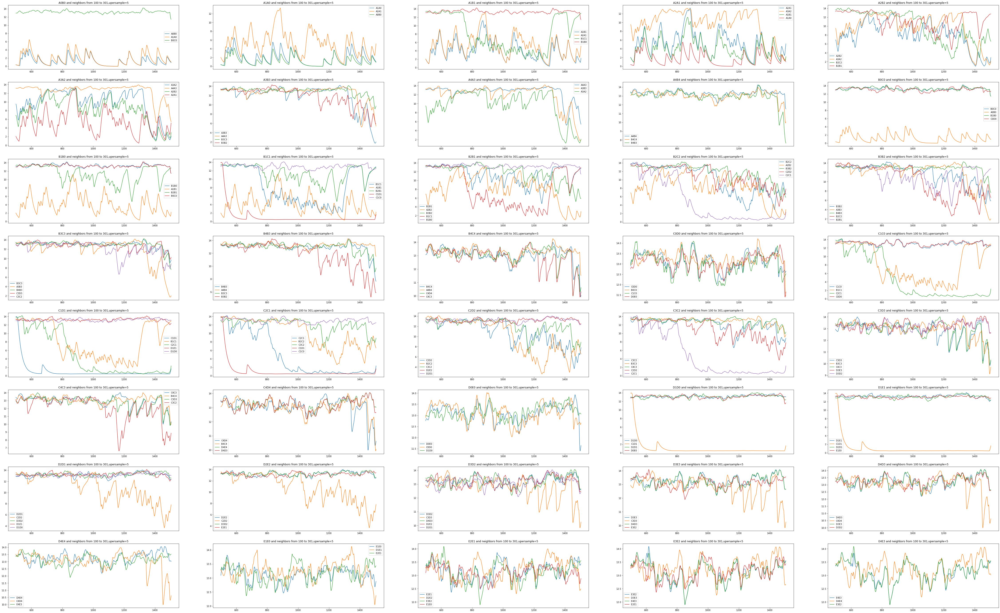

In [34]:
# 画图序列图，是一个独立模块
start_time = 100
end_time = 300+1
fig, axes = plt.subplots(8,5,figsize=(80,50))
for entry_point in range(0,40):
    sel_data = selectdata(df_new,entry_point,start_time,end_time,upersample)
    data_copy = sel_data.copy()
    data_copy.columns = [data_head[i] for i in list(data_copy.columns)]
    data_copy.plot(title='{} and neighbors from {} to {},upersample={}'.format(data_head[entry_point],start_time,end_time,upersample),ax=axes[int(entry_point/5),entry_point%5])

plt.savefig('./data.png')
plt.show()

# 根因分析

In [31]:
import pandas as pd
import numpy as np
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

In [26]:
def load_matrix():
    df = pd.read_excel('./casuality_matrix.xlsx',index_col=0)
    matrix = np.array(df)
    return df,matrix

In [19]:
def draw_matrix(df):
    plt.figure(figsize=(32,18),dpi=300)
    ax = sns.heatmap(df,cmap="YlGnBu", annot=True, linewidths=.5)
    plt.xlabel('result')
    plt.ylabel('factor')
    plt.title('casuality matrix')
    plt.savefig('casuality_matrix.png')
    plt.show()

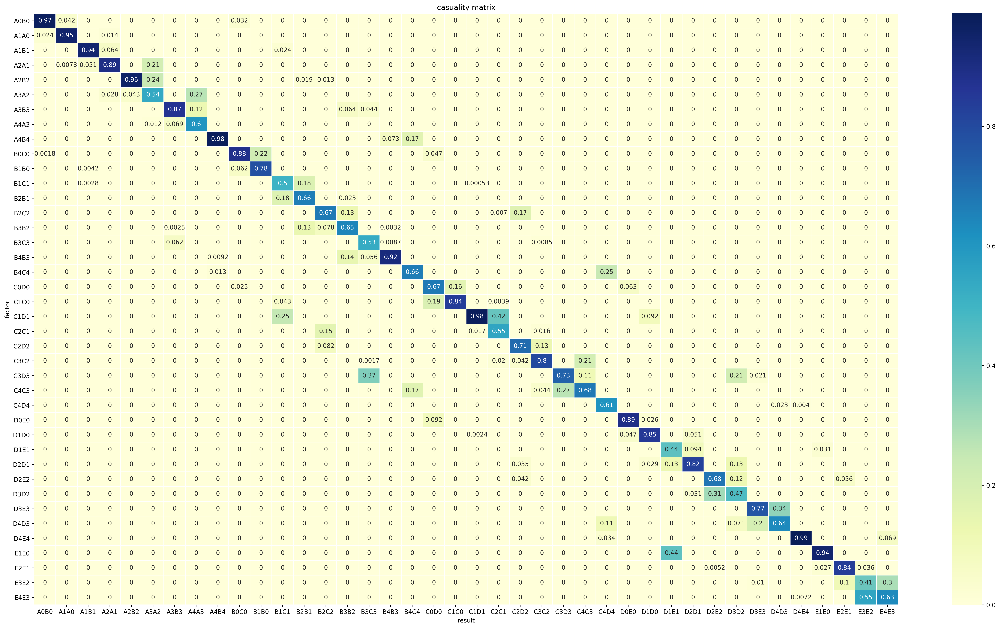

In [27]:
df_matrix,matrix = load_matrix()
draw_matrix(df_matrix)

In [21]:
def bfs(
    transition_matrix, entry_point, threshold=0.1, reach_end=True, max_path_length=None
):
    path_list = set()
    queue = [[entry_point]]
    while len(queue) > 0:
        # Limit output path list size to 10000 in case of infinite bfs
        if len(path_list) > 10000:
            break
            
        path = queue.pop(0)

        # if there is at least one previous node
        if max_path_length is not None and len(path) >= max_path_length:
            # if path length exceeds limit
            path_list.add(tuple(path))
        else:
            # Try extending the path with every possible node
            go_deeper = False
            for nextnode in range(np.shape(transition_matrix)[1]):
                if transition_matrix[nextnode][path[-1]] > threshold and (
                    nextnode not in path
                ):
                    # extend the path
                    new_path = path + [nextnode]
                    queue.append(new_path)
                    go_deeper = True
            if not go_deeper:
                path_list.add(tuple(path))
    return path_list

In [22]:
def randwalk(
    transition_matrix,
    entry_point,
    bfs_threshold=0.1,
    mean_method="geometric",
    max_path_length=None,
):
    """Rand walk using transition matrix and output all pathes sorted
    by path probability
    """

    matrix = transition_matrix
    path_list = bfs(
        matrix,
        entry_point,
        threshold=bfs_threshold,
        reach_end=True,
        max_path_length=max_path_length,
    )

    path_list_prob = []
    for path in path_list:
        p = []
        end = path[0]
        for start in path[1:]:
            p.append(matrix[start][end])
            end = start
        if len(p) == 0:
            path_list_prob.append(0)
        else:
            if mean_method == "arithmetic":
                path_list_prob.append(np.mean(p))
            elif mean_method == "geometric":
                # Remove probability equal to 1 because they
                # don't contain useful information.
                p = [_ for _ in p if _ != 1]
                path_list_prob.append(stats.gmean(p))
            elif mean_method == "harmonic":
                # Remove probability equal to 1 because they
                # don't contain useful information.
                p = [_ for _ in p if _ != 1]
                path_list_prob.append(stats.hmean(p))

    # sort path by descending probability
    out = [item for item in zip(path_list_prob, path_list)]
    out.sort(key=lambda x: x[0], reverse=True)
    return out

In [63]:
def ranknode(
    data, out_path, entry_point, topk_path=60, prob_thres=0.1, num_sel_node=1
):
    path_node_count = defaultdict(int)
    topk_path = min(len(out_path)+1,topk_path)
    # select only first topk paths with prob >= threshold
    for i in out_path[:topk_path]:
        for node in i[1][-num_sel_node:]:
            path_node_count[node] = path_node_count[node] + 1
        if i[0] < prob_thres:
            break
    # exclude entry point
    if entry_point in path_node_count:
        path_node_count.pop(entry_point)
    # endregion

    # region Calculate correlation between selected node and entry point
    path_node_corr = {}
    for node in path_node_count:
        ret = np.corrcoef(
            np.concatenate(
                [np.array(data[:][entry_point]).reshape(1,-1), np.array(data[:][node]).reshape(1,-1)],
                axis=0,
            )
        )
        #     print('Node:{} Corr:{}'.format(node, abs(ret[0, 1])))
        path_node_corr[node] = abs(ret[0, 1])
    # endregion

    # region Estimate node root cause score according to both
    #        path count and correlation
    rank_list = []
    for node in path_node_count:
        rank_list.append(
            [
                node,
                path_node_count[node] * 1.0 / (num_sel_node * topk_path)
                + path_node_corr[node] * 1.0,
            ]
        )
    rank_list.sort(key=lambda x: x[1], reverse=True)
    # endregion
    return rank_list

In [62]:
def analyze_root(
    transition_matrix,
    entry_point,
    bfs_threshold,
    local_data,
    mean_method="geometric",
    max_path_length=None,
    topk_path=60,
    prob_thres=0.1,
    num_sel_node=1,
):
    out_path = randwalk(
        transition_matrix,
        entry_point,
        bfs_threshold=bfs_threshold,
        mean_method=mean_method,
        max_path_length=max_path_length,
    )
    ranked_nodes = ranknode(
        local_data,
        out_path,
        entry_point,
        topk_path=topk_path,
        prob_thres=prob_thres,
        num_sel_node=num_sel_node,
    )
    return out_path,ranked_nodes

In [69]:
def prCal(scoreList, prk, rightOne):
    # 计算scoreList的prk值
    prkSum = 0
    for k in range(min(prk, len(scoreList))):
        if scoreList[k][0] in rightOne:
            prkSum = prkSum + 1
    denominator = min(len(rightOne), prk)
    return prkSum / denominator

In [70]:
def pr_stat(scoreList, rightOne, k=5):
    topk_list = range(1, k + 1)
    prkS = [0] * len(topk_list)
    for j, k in enumerate(topk_list):
        prkS[j] += prCal(scoreList, k, rightOne)
    return prkS

In [71]:
def my_acc(scoreList, rightOne, n=None):
    """Accuracy for Root Cause Analysis with multiple causes.
    Refined from the Acc metric in TBAC paper.
    """
    node_rank = [_[0] for _ in scoreList]
    if n is None:
        n = len(scoreList)
    s = 0.0
    for i in range(len(rightOne)):
        if rightOne[i] in node_rank:
            rank = node_rank.index(rightOne[i]) + 1
            s += (n - max(0, rank - len(rightOne))) / n
        else:
            s += 0
    s /= len(rightOne)
    return s

In [72]:
path = './data/rawdata.xlsx'
window1 = 10
upersample = 5
window2 = 5
start_time = 100
end_time = 300
step = 25


data_head,df = load_data(path)
df_new = data_pretreat(df,window1,upersample,window2)
true_root_cause = [data_head.index('C1D1')]

path_res = []
prkS_list = []
acc_list = []
for entry_point in range(40):
    data_filter,head_filtted,sel_data = selectdata(df_new,None,start_time,end_time,upersample)
    prob_path,ranked_nodes = analyze_root(matrix,entry_point,0.1,sel_data)
    path_res.append(prob_path)

    prkS = pr_stat(ranked_nodes, true_root_cause)
    acc = my_acc(ranked_nodes, true_root_cause)
    prkS_list.append(prkS)
    acc_list.append(acc)
prkS = np.mean(np.array(prkS_list), axis=0).tolist()
acc = float(np.mean(np.array(acc_list)))

In [73]:
path_res

[[(0, (0,))],
 [(0, (1,))],
 [(0, (2,))],
 [(0, (3,))],
 [(0, (4,))],
 [(0.23719198462243854, (5, 4)), (0.21199766025127206, (5, 3))],
 [(0, (6,))],
 [(0.2539583151243272, (7, 5, 4)),
  (0.2400921532315405, (7, 5, 3)),
  (0.12320851013368397, (7, 6))],
 [(0, (8,))],
 [(0, (9,))],
 [(0.2174283176077851, (10, 9))],
 [(0.2528339217238029, (11, 20)),
  (0.18087602983446172, (11, 12, 14, 13, 21, 20)),
  (0.14958305055203344, (11, 12, 14, 16))],
 [(0.21499320261365115, (12, 11, 20)),
  (0.18190230172768648, (12, 14, 13, 21, 20)),
  (0.13757750391057658, (12, 14, 16))],
 [(0.25464933206719653, (13, 21, 20))],
 [(0.20109424553695962, (14, 13, 21, 20)), (0.1405856530850245, (14, 16))],
 [(0.22570774968559523, (15, 24, 25, 23, 22, 13, 21, 20))],
 [(0, (16,))],
 [(0.19286242626182704, (17, 25, 23, 22, 13, 21, 20)),
  (0.1653188753381043, (17, 8)),
  (0.13803553250023706, (17, 25, 24))],
 [(0.18848252859044173, (18, 19))],
 [(0.1583228208666259, (19, 18))],
 [(0, (20,))],
 [(0.4188861476801914, (2

In [74]:
prkS

[0.2, 0.275, 0.35, 0.35, 0.35]

In [75]:
acc

0.26666666666666666

In [84]:
def get_nodeedge_pos():
    nodes = []
    for i in range(4,-1,-1):
        row=[]
        for j in ['A','B','C','D','E']:
            row.append(j+str(i))
        nodes.append(row)
    edge_pos = {}
    for i,row in enumerate(nodes):
        for j,node in enumerate(row):
            if i+1<len(nodes):
                edge_pos[node+nodes[i+1][j]]=(j,4-(i+0.5))
            if j+1<len(row):
                edge_pos[node+nodes[i][j+1]]=(j+0.5,4-i)
    node_pos={}
    for i,row in enumerate(nodes):
        for j,node in enumerate(row):
            node_pos[node]=(j,4-i)
    return nodes,edge_pos,node_pos 

In [85]:
def path2edge(res_list,prob_thre=0):
    #select_thre = 0.45
    #max_score = 0
    #for item in res_list:
    #    node_index,path_res = item
    #    for path in path_res:
    #        max_score = max(max_score,path[0])

    graph_edges = []
    for item in res_list:
        for prob_path in item:
            prob,path = prob_path
            if len(path) <= 1:
                continue
            if prob<prob_thre:   #max_score*select_thre:
                continue
            res = []
            for idx,path_step in enumerate(path[:-1]):
                res.append((data_head[path_step],data_head[path[idx+1]],prob))
            graph_edges.append(res)
    return graph_edges

In [86]:
import random
def randomcolor():
    s = 3
    while s>1:
        res = (random.randint(0,16)/16,random.randint(0,16)/16,random.randint(0,16)/16)
        s = sum(res)
    return res

In [87]:
import networkx as nx
import matplotlib.pyplot as plt
import math
import os

In [88]:
def draw_path(edge_list,nodes,labels,data_head,edge_pos,node_pos):
    G = nx.DiGraph() # 定义了一个空图
    G.add_nodes_from(data_head)
    # edge_list = path2edge(res_list)
    #plt.figure(3,figsize=(15,15)) 
    #plt.figure(3,figsize=(8,8)) 
    rows = math.ceil(math.sqrt(len(edge_list)))

    i=0
    plt.figure(3,figsize=(50,50),dpi=300)
    for path_edge in edge_list:
        i = i+1

        plt.subplot(rows,rows,i)
        G_tmp = nx.DiGraph()
        G_tmp.add_nodes_from(data_head)
        G_tmp.add_weighted_edges_from(path_edge)
        #curved_graph(G_tmp,edge_pos)
        nx.draw_networkx_edges(G_tmp,pos=edge_pos,
                                width=[float(d['weight']*10) for (u,v,d) in G_tmp.edges(data=True)],
                                edge_color=[randomcolor()]*len(G_tmp.edges()))
    
        nx.draw_networkx_nodes(G,pos=edge_pos,alpha=0.3,node_color='r',node_size=50)
        nx.draw_networkx_labels(G,pos=edge_pos,labels=labels,font_size=5) 

        G2 = nx.Graph()
        G2.add_nodes_from(np.array(nodes).flatten())
        nx.draw_networkx_nodes(G2,pos=node_pos,alpha=0.3,node_color='b',node_size=25)
    #plt.title('path network')
    plt.savefig("./path.png")
    plt.show()

In [89]:
nodes,edge_pos,node_pos = get_nodeedge_pos()
graph_edge = path2edge(path_res)
labels = {}
for i in data_head:
    labels[i] = i
draw_path(graph_edge,nodes,labels,data_head,edge_pos,node_pos)